In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm

In [36]:
fce = pd.read_csv('../datasets/farm_cat_eco.csv') #fce = farm_cat_eco

In [14]:
from ydata_profiling import ProfileReport
ProfileReport(fce)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:00<00:00, 394.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
fce.head()

,year,territory,lambs,rams,ewes,lamb_sheep_shorn,sheep_flock,sheep_purchased,cats_occurrence_total,cats_forest,...,eco_sector_authorities_stakeholders,eco_sector_environment,eco_sector_health,eco_type_control,eco_type_control_education,eco_type_control_medical_care,eco_type_control_prevention,eco_type_damage_loss,eco_type_eradication,eco_type_prevention
0,2002,All Australia,10658.0,662.0,26531.0,51883.0,47861.0,3300.0,197.0,77.0,...,825276.359414,0.0,0.0,825276.359414,0.0,0.0,0.0,0.0,0.0,0.0
1,2002,New South Wales,2624.0,131.0,5996.0,11360.0,10544.0,770.0,104.0,46.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2002,Northern Territory,0.0,0.0,0.0,0.0,0.0,0.0,34.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2002,Queensland,1421.0,103.0,5020.0,11123.0,9707.0,584.0,24.0,17.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2002,South Australia,2148.0,137.0,5372.0,8857.0,8938.0,692.0,18.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
fce.info

<bound method DataFrame.info of      year           territory    lambs   rams     ewes  lamb_sheep_shorn  \
0    2002       All Australia  10658.0  662.0  26531.0           51883.0   
1    2002     New South Wales   2624.0  131.0   5996.0           11360.0   
2    2002  Northern Territory      0.0    0.0      0.0               0.0   
3    2002          Queensland   1421.0  103.0   5020.0           11123.0   
4    2002     South Australia   2148.0  137.0   5372.0            8857.0   
..    ...                 ...      ...    ...      ...               ...   
174  2022          Queensland   1056.0   59.0   2039.0            3267.0   
175  2022     South Australia   3003.0  123.0   5280.0            9578.0   
176  2022            Tasmania    567.0   20.0   1029.0            1804.0   
177  2022            Victoria   1608.0   50.0   2272.0            4236.0   
178  2022   Western Australia   1905.0   82.0   3224.0            6344.0   

     sheep_flock  sheep_purchased  cats_occurrence_tota

In [28]:
fce['cats_nonforest'] = fce['cats_occurrence_total'] - fce['cats_forest']
fce['cats_nonforest']

0      120.0
1       58.0
2       32.0
3        7.0
4       14.0
       ...  
174     62.0
175    136.0
176     73.0
177     67.0
178     51.0
Name: cats_nonforest, Length: 179, dtype: float64

## Correlation Matrix

In [29]:
corr = fce[['sheep_flock', 'cats_occurrence_total', 'rams', 'ewes', 'cats_nonforest', 'sheep_purchased']].corr()
corr.style.background_gradient(cmap='BuPu')

,sheep_flock,cats_occurrence_total,rams,ewes,cats_nonforest,sheep_purchased
sheep_flock,1.000000,0.609361,0.888219,0.894446,0.693851,0.949133
cats_occurrence_total,0.609361,1.000000,0.641141,0.662833,0.869734,0.494872
rams,0.888219,0.641141,1.000000,0.993576,0.710633,0.821213
ewes,0.894446,0.662833,0.993576,1.000000,0.730249,0.828589
cats_nonforest,0.693851,0.869734,0.710633,0.730249,1.000000,0.584091
sheep_purchased,0.949133,0.494872,0.821213,0.828589,0.584091,1.000000


# Sheep vs Cat occurences over the years; Trend Analysis 
### (this was a dud😭, little correlation, low R, p value too high, no significant rs, Durbin Watson was under 1.15 meaning there could be a correlation btw residuals for the territories with negative corr, high skew and kurtosis)

## Sheep vs Cat Occurrence

In [30]:
# Top sheep states
sheep_states = ['New South Wales', 'Western Australia', 'South Australia', 'Victoria']
sheep_df = fce[fce['territory'].isin(sheep_states)]

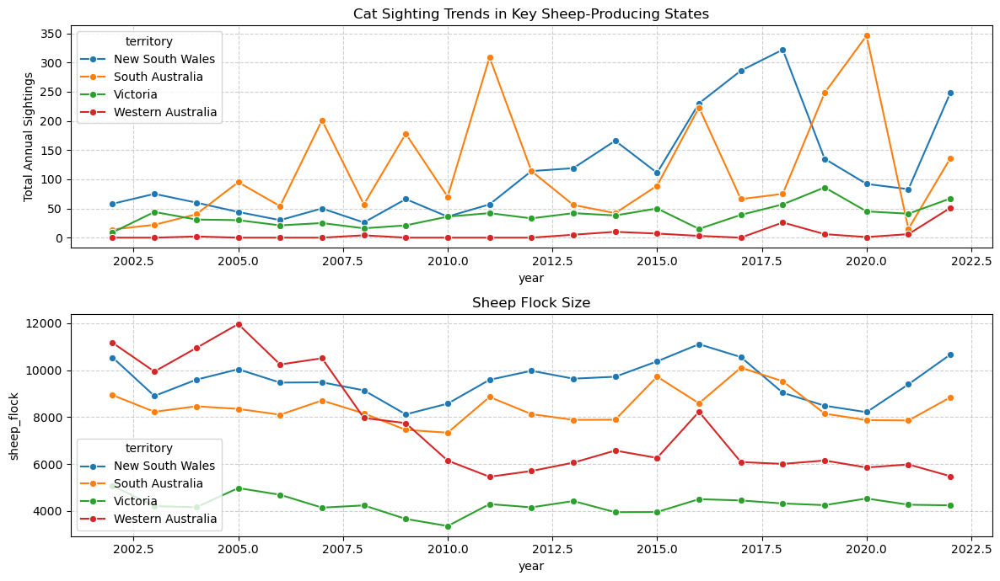

In [31]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
trend_df = sheep_df.groupby(['year', 'territory'])['cats_nonforest'].sum().reset_index()
trend_df2 = sheep_df.groupby(['year', 'territory'])['sheep_flock'].sum().reset_index()

sns.lineplot(data=trend_df, x='year', y='cats_nonforest', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=trend_df2, x='year', y='sheep_flock', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Sheep Flock Size')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

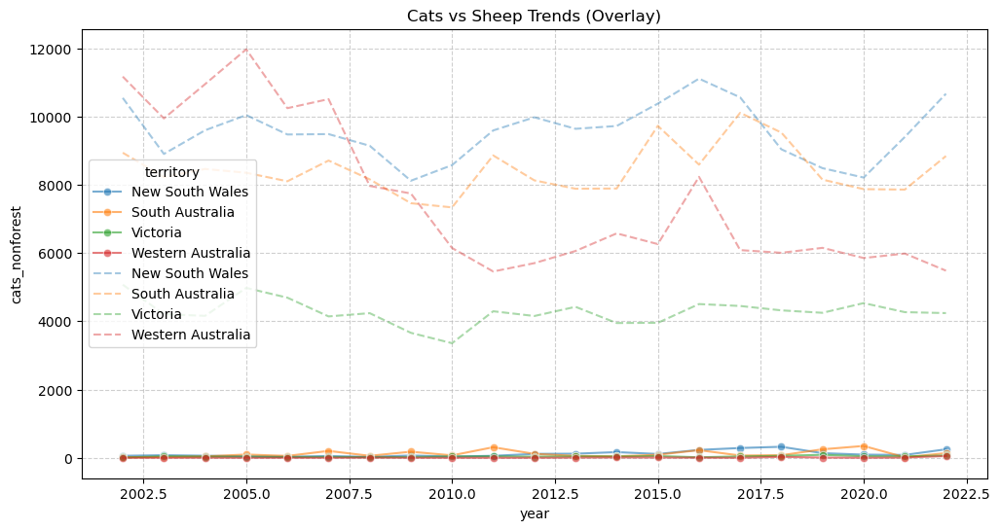

In [37]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=trend_df,
    x='year',
    y='cats_nonforest',
    hue='territory',
    marker='o',
    alpha=0.6
)

sns.lineplot(
    data=trend_df2,
    x='year',
    y='sheep_flock',
    hue='territory',
    linestyle='--',
    alpha=0.4
)

plt.title('Cats vs Sheep Trends (Overlay)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Normalize cat nonforest and sheep flock to compare trends

In [38]:
trend_df['cats_scaled'] = (
    trend_df.groupby('territory')['cats_nonforest']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

trend_df2['sheep_scaled'] = (
    trend_df2.groupby('territory')['sheep_flock']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

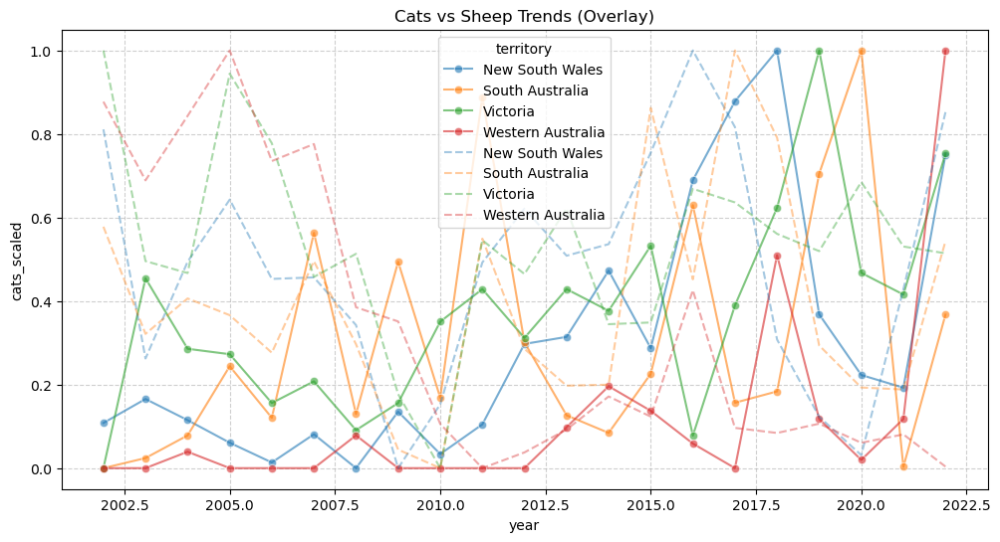

In [39]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=trend_df,
    x='year',
    y='cats_scaled',
    hue='territory',
    marker='o',
    alpha=0.6
)

sns.lineplot(
    data=trend_df2,
    x='year',
    y='sheep_scaled',
    hue='territory',
    linestyle='--',
    alpha=0.4
)

plt.title('Cats vs Sheep Trends (Overlay)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


## By Territory

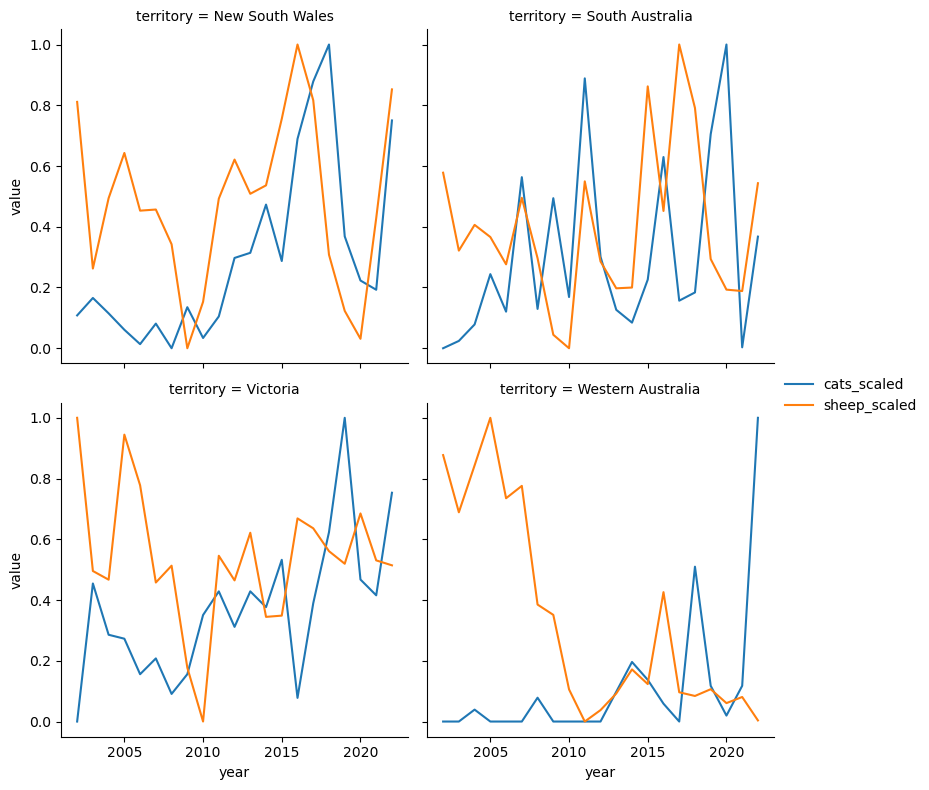

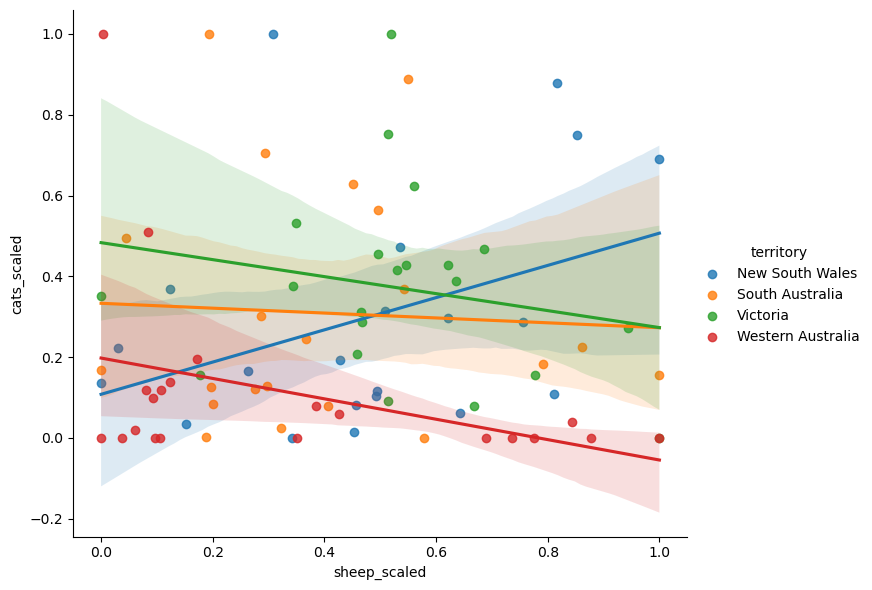

In [40]:
# Merge scaled datasets first
merged = trend_df[['year', 'territory', 'cats_scaled']].merge(
    trend_df2[['year', 'territory', 'sheep_scaled']],
    on=['year', 'territory']
)

# Melt to long format
plot_df = merged.melt(
    id_vars=['year', 'territory'],
    value_vars=['cats_scaled', 'sheep_scaled'],
    var_name='variable',
    value_name='value'
)

g = sns.FacetGrid(plot_df, col='territory', col_wrap=2, height=4, sharey=True)
g.map_dataframe(sns.lineplot, x='year', y='value', hue='variable')
g.add_legend()


sns.lmplot(
    data=merged,
    x='sheep_scaled',
    y='cats_scaled',
    hue='territory',
    height=6,
    aspect=1.2
)


## Full Analysis

In [41]:
merged = trend_df.merge(
    trend_df2,
    on=['year', 'territory']
)

correlations = merged.groupby('territory').apply(
    lambda x: x['cats_nonforest'].corr(x['sheep_flock'])
)

print(correlations)


territory
New South Wales      0.374041
South Australia     -0.053004
Victoria            -0.201146
Western Australia   -0.364594
dtype: float64


C:\Users\d\AppData\Local\Temp\ipykernel_9220\1227266040.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = merged.groupby('territory').apply(


In [ ]:
for state in merged['territory'].unique():
    state_df = merged[merged['territory'] == state]

    X = sm.add_constant(state_df['sheep_flock'])
    y = state_df['cats_nonforest']

    model = sm.OLS(y, X).fit()
    print(f"\n{state}")
    print(model.summary())
# if p value less than 0.05 signif


New South Wales
                            OLS Regression Results                            
Dep. Variable:         cats_nonforest   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     3.091
Date:                Wed, 18 Feb 2026   Prob (F-statistic):             0.0948
Time:                        11:15:36   Log-Likelihood:                -121.52
No. Observations:                  21   AIC:                             247.0
Df Residuals:                      19   BIC:                             249.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        -262.4719    215.287

In [46]:
merged['cats_diff'] = merged.groupby('territory')['cats_nonforest'].diff()
merged['sheep_diff'] = merged.groupby('territory')['sheep_flock'].diff()

merged.groupby('territory').apply(
    lambda x: x['cats_diff'].corr(x['sheep_diff']), include_groups=False
)


territory
New South Wales      0.213885
South Australia      0.070748
Victoria            -0.361068
Western Australia   -0.059610
dtype: float64

# Economic Impact

### cat cost and occurrence Correlation Matrix

In [50]:
eco_corr = fce[['eco_cost_cat_only', 'cats_occurrence_total']].corr()
eco_corr.style.background_gradient(cmap='OrRd')

,eco_cost_cat_only,cats_occurrence_total
eco_cost_cat_only,1.000000,0.406506
cats_occurrence_total,0.406506,1.000000


### Graphing

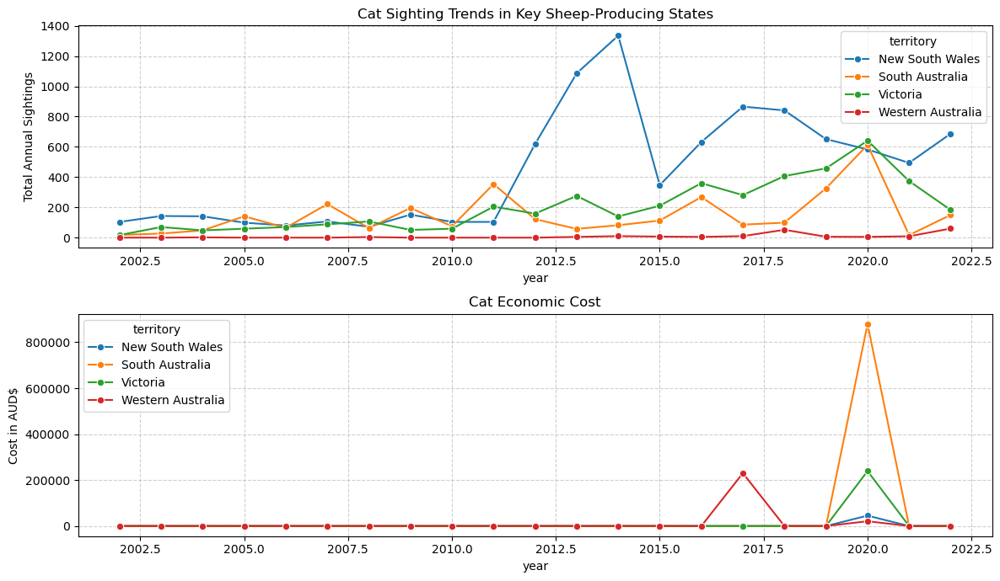

In [58]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
trend_df = sheep_df.groupby(['year', 'territory'])['cats_occurrence_total'].sum().reset_index()
trend_df2 = sheep_df.groupby(['year', 'territory'])['eco_cost_cat_only'].sum().reset_index()

sns.lineplot(data=trend_df, x='year', y='cats_occurrence_total', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=trend_df2, x='year', y='eco_cost_cat_only', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Cat Economic Cost')
ax[1].set_ylabel('Cost in AUD$')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

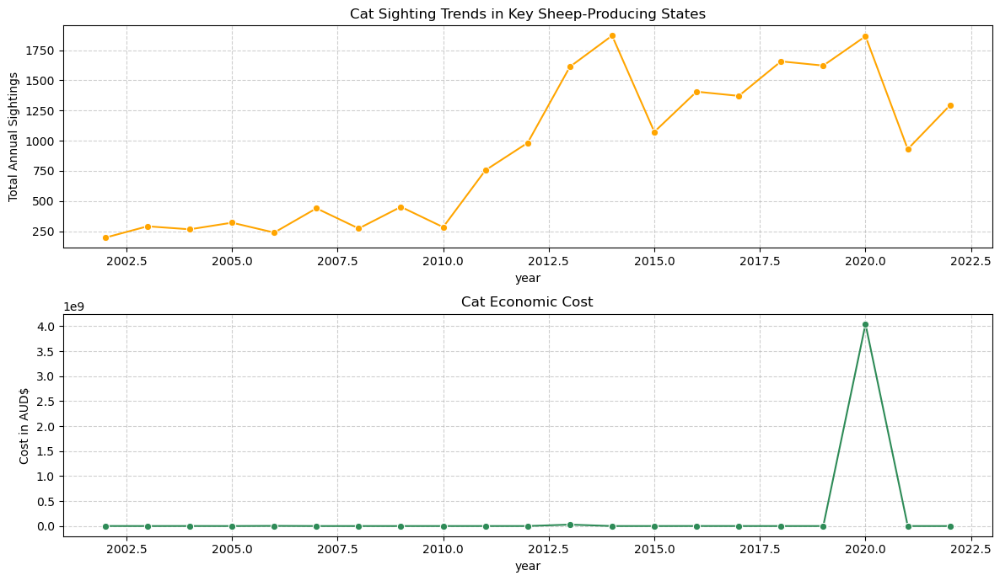

In [69]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
whole_country_fce = fce[fce['territory'] == 'All Australia'].groupby('year')['cats_occurrence_total'].sum().reset_index()
whole_country_fce2 = fce[fce['territory'] == 'All Australia'].groupby('year')['eco_cost_cat_only'].sum().reset_index()

sns.lineplot(data=whole_country_fce, x='year', y='cats_occurrence_total', color='orange', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=whole_country_fce2, x='year', y='eco_cost_cat_only', color='seagreen', marker='o', ax=ax[1])
ax[1].set_title('Cat Economic Cost')
ax[1].set_ylabel('Cost in AUD$')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

# Feral cat effect on sheep productivity
### (toxoplasmosis causes pregnancy complications)

### Lamb/Ewe Correlation Matrix (child/female)

In [70]:
lamb_corr = fce[['lambs', 'ewes']].corr()
lamb_corr.style.background_gradient(cmap='BuGn')

,lambs,ewes
lambs,1.000000,0.988165
ewes,0.988165,1.000000


### Lambing productivity compared to cat occurrence in areas

In [71]:
fce['fecundity'] = fce['lambs'] / fce['ewes'] # child/mother
fce['fecundity']

0      0.401719
1      0.437625
2           NaN
3      0.283068
4      0.399851
         ...   
174    0.517901
175    0.568750
176    0.551020
177    0.707746
178    0.590881
Name: fecundity, Length: 179, dtype: float64

In [72]:
sheep_df['fecundity'] = sheep_df['lambs'] / sheep_df['ewes']

C:\Users\d\AppData\Local\Temp\ipykernel_9220\1168001218.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sheep_df['fecundity'] = sheep_df['lambs'] / sheep_df['ewes']


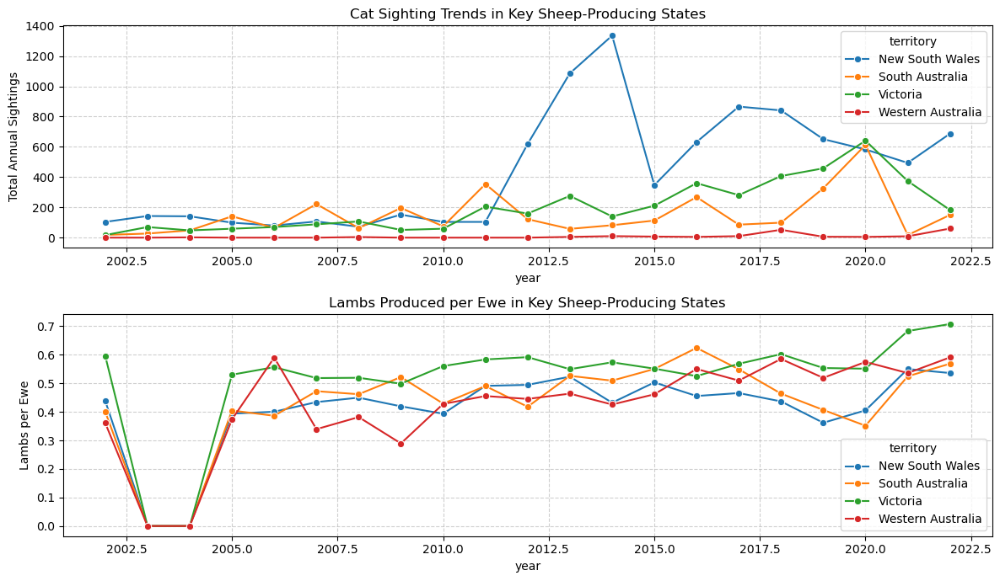

In [74]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
lamb_trend_df = sheep_df.groupby(['year', 'territory'])['cats_occurrence_total'].sum().reset_index()
lamb_trend_df2 = sheep_df.groupby(['year', 'territory'])['fecundity'].sum().reset_index()

sns.lineplot(data=lamb_trend_df, x='year', y='cats_occurrence_total', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=lamb_trend_df2, x='year', y='fecundity', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Lambs Produced per Ewe in Key Sheep-Producing States')
ax[1].set_ylabel('Lambs per Ewe')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

# Combined economic/sheep productivity analysis